# Imports y Preparacion del dataset

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn as sk
import sklearn.preprocessing as skp
import scipy.stats as stats
import scipy as sc
from sklearn.feature_extraction import FeatureHasher
from sklearn.feature_selection import VarianceThreshold
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import confusion_matrix, classification_report

#joblib
#from joblib import dump, load
import joblib

# multivariado   
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import DistanceMetric

from sklearn import metrics

from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score#, precision_recall_curve, roc_curve, 




In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
df = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_train.csv') 
df_test = pd.read_csv('/content/drive/MyDrive/Datasets/hotels_test.csv')
df_test_original = df_test.copy()
df_original = df.copy()


#Preprocesamiento

In [4]:
columnas = {"adr": "average_daily_rate", "arrival_date_year":"year", "arrival_date_month":"month", "arrival_date_day_of_month":"day"} #cambiar nombres a las categorias
df.rename(columns = columnas, inplace = True)
df = df.drop(columns=['arrival_date_week_number'])
#CAMBIO EL UNDEFINED A SC :)
df.loc[df.loc[:,"meal"]=='Undefined',"meal"]="SC"
paises_comunes = ['PRT','GBR','FRA','ESP','DEU','ITA','IRL', 'BRA', 'BEL', 'USA', 'NLD', 'CHE', 'CN', 'AUT', 'CHN', 'SWE', 'POL', 'RUS', 'ISR', 'NOR']
df.loc[~df.loc[:,"country"].isin(paises_comunes),"country"]="OTHER"
#TENEMOS QUE VER LOS 2 UNDEFINED 
df.drop(df[df['market_segment']=='Undefined'].index, axis='index',inplace=True)
df.drop(df[df['distribution_channel']=='Undefined'].index, axis='index',inplace=True)
#ROOM TYPES
room_type_populares = ["A", "D", "E", "F", "G"]
df.loc[~df.loc[:,"assigned_room_type"].isin(room_type_populares),"assigned_room_type"]="O"
df.loc[~df.loc[:,"reserved_room_type"].isin(room_type_populares),"reserved_room_type"]="O"
#ARRIVAL_DATE
months = {'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 'August':8,'September':9, 'October':10,'November':11, 'December': 12 }
df.month = df.month.map(months)
arrivaldates = df.copy() 
import datetime

date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)

date = pd.to_datetime(date)

df = df.drop(columns=['year', 'month', 'day'])

df.insert(0, 'arrival_date', date)

#DROP COMPANY
df= df.drop(columns=['company', 'reservation_status_date'])
#CHILDREN
df['children'] = df['children'].fillna(0.0)
df['children'] = df['children'].astype(int)
#AGENT
df['agent'] = df['agent'].fillna(9.0)
df['agent'] = df['agent'].astype(int)


#COUNTRY
df['country'] = df['country'].fillna('PRT')
#eliminamos el outlier porque una fila respecto a la gran cantidad de datos que tenemos no es relevante
df.drop(df[df['average_daily_rate']<0].index, axis='index',inplace=True)
df.drop(df[df['average_daily_rate']==0].index, axis='index',inplace=True)
#
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
df.drop(df[(df['babies']==0) & (df['adults']==0) & (df['children']==0)].index, axis='index',inplace=True)
#creamos una nueva col para verificar el tipo de habitacion
df['assigned_equals_reserved'] = np.where(df['assigned_room_type']== df['reserved_room_type'], True, False)
df['assigned_equals_reserved']=df['assigned_equals_reserved'].astype(int)
#TEMPORADA ALTA
temporada_alta = [1,6,7,8,12]
df['temporada_alta'] = pd.DatetimeIndex(df['arrival_date']).month.isin(temporada_alta)
df['temporada_alta'] = df['temporada_alta'] .astype(int)
#DUMMIES
dataset = df.copy()
dataset = pd.get_dummies(dataset, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["distribution_channel"], drop_first=True)
dataset = pd.get_dummies(dataset, columns=["market_segment"], drop_first=True)

In [5]:
df_test.drop(df_test[df_test['market_segment']=='Undefined'].index, axis='index',inplace=True)
df_test.drop(df_test[df_test['distribution_channel']=='Undefined'].index, axis='index',inplace=True)

df_test = pd.get_dummies(df_test, columns=["hotel","meal","deposit_type","customer_type","country"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["distribution_channel"], drop_first=True)
df_test = pd.get_dummies(df_test, columns=["market_segment"], drop_first=True)
df_test.rename(columns = columnas, inplace = True)
df_test = df_test.drop(columns=['arrival_date_week_number'])
df_test.month = df_test.month.map(months)
arrivaldates = df_test.copy()

date=arrivaldates.apply(lambda x: datetime.date(int(x['year']), x['month'], x['day']),axis=1)
date = pd.to_datetime(date)
df_test = df_test.drop(columns=['year', 'month', 'day'])
df_test.insert(0, 'arrival_date', date)

df_test= df_test.drop(columns=['company'])
moda = df_test['agent'].mode() #decidimos calcular la moda (el valor con mayor freuencia)
df_test['agent'] = df_test['agent'].fillna(9.0) #Cambiamos los datos faltantes por la moda, dado que es el que mas se repite y poder afectar menos nuestra distribucion

df_test['assigned_equals_reserved'] = np.where(df_test['assigned_room_type']== df_test['reserved_room_type'], True, False) #creamos una nueva col para verificar el tipo de habitacion
df_test['assigned_equals_reserved']=df_test['assigned_equals_reserved'].astype(int)

df_test['temporada_alta'] = pd.DatetimeIndex(df_test['arrival_date']).month.isin(temporada_alta)
df_test['temporada_alta'] = df_test['temporada_alta'] .astype(int)

# CHECKPOINT 2


Aca arrancamos con arboles :)


In [6]:
target='is_canceled'

In [7]:
#Verifico balanceo de clases
dataset[target].value_counts(normalize=True)*100

1    50.451558
0    49.548442
Name: is_canceled, dtype: float64

# Arbol de decision N1

In [8]:
features1= ['hotel_Resort Hotel','meal_FB','meal_HB','meal_SC','lead_time', 'adults', 'children', 'babies', 'previous_cancellations','days_in_waiting_list']

In [9]:
#Separo un set de Evaluacion 
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(dataset[features1].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion 

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [10]:
dataset.shape

(61011, 60)

In [11]:
##KFOLD CV Random Search para buscar el mejor arbol 
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES
               'max_depth':list(range(1,8))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=20 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)  

#Clasificador  
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation 
randomcv = RandomizedSearchCV(estimator=base_tree, 
                              param_distributions = params_grid,
                              scoring=scorer_fn, 
                              cv=kfoldcv,
                              n_iter=n) 

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train);

In [12]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 3, 'criterion': 'entropy', 'ccp_alpha': 0.0018965517241379313}
0.7096570530939881


In [13]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ 
feat_imps = best_tree.feature_importances_ 

for feat_imp,feat in sorted(zip(feat_imps,features1)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_cancellations: 0.39493659890216265
lead_time: 0.6050634010978374


In [14]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) 

reglas = export_text(arbol, feature_names=list(features1)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- previous_cancellations <= 0.50
|   |   |   |--- class: 0
|   |   |--- previous_cancellations >  0.50
|   |   |   |--- class: 1
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50
|   |   |--- lead_time <= 265.50
|   |   |   |--- class: 1
|   |   |--- lead_time >  265.50
|   |   |   |--- class: 1
|   |--- previous_cancellations >  0.50
|   |   |--- class: 1



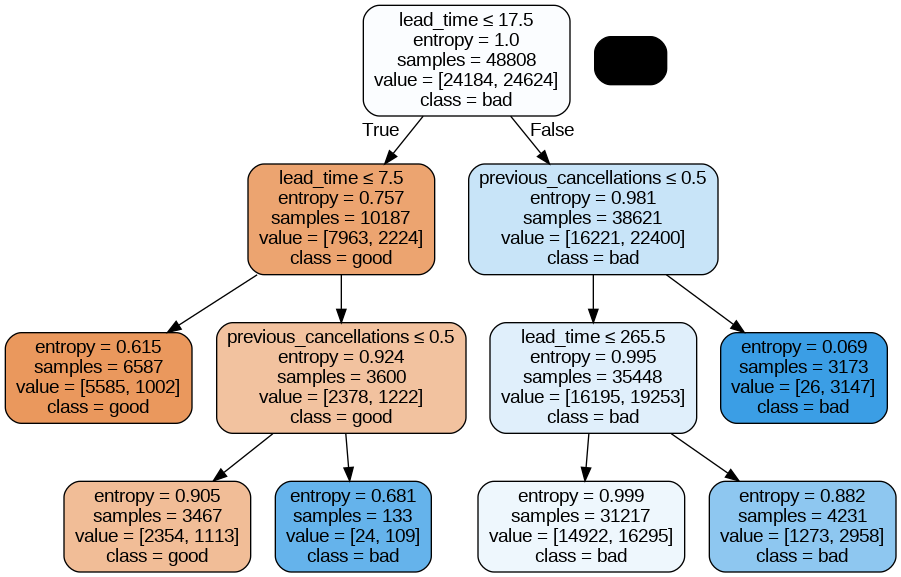

In [15]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features1,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [16]:
#Realizamos una predicción sobre el set de test
y_pred = arbol.predict(x_test)
#Valores Predichos
y_pred

array([1, 1, 1, ..., 1, 0, 1])

In [17]:
print('correctas: ', np.sum(y_test == y_pred))
print('total: ', len(y_test))

correctas:  7607
total:  12203


In [18]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred,)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.6233713021388183
Recall: 0.9098586974175735
Precision: 0.5809395416364203
f1 score: 0.709113924050633


In [19]:
joblib.dump(arbol, 'arbol1.pkl')

['arbol1.pkl']

# Arbol de decision N2

In [20]:
features2= ['lead_time','previous_cancellations','booking_changes','previous_bookings_not_canceled', 'stays_in_week_nights','days_in_waiting_list']

In [21]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features2].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [22]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 

#Conjunto de parámetros que quiero usar 
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(1,6))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=45 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n)  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); 

In [23]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 5, 'criterion': 'entropy', 'ccp_alpha': 0.0011379310344827587}
0.7232483612314597


In [24]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features2)):
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

stays_in_week_nights: 0.018240557332971502
previous_bookings_not_canceled: 0.04436899561263551
booking_changes: 0.13919575622169486
previous_cancellations: 0.3061238800964075
lead_time: 0.49207081073629055


# Arbol de decision N3

In [25]:
features3= ['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled','days_in_waiting_list' ]

In [26]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features3].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [27]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=20 

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(2,12))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=25 

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = GridSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_grid = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_jobs=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [28]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #EL ARBOL QUE MEJOR PERFORMO TIENE ESTO, AL SER RANDOM, AL VOLVER A CORRER PUEDE QUE ME DEN OTROS, EN ESTE CASO F1, SI DA MUY BAJO PUEDO MODIFICAR MIS PARAMETRO

{'ccp_alpha': 0.001, 'criterion': 'entropy', 'max_depth': 5}
0.7230832395837093


In [29]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features3)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

previous_bookings_not_canceled: 0.04481537762937892
booking_changes: 0.14059615939797654
previous_cancellations: 0.30920369276928744
lead_time: 0.5053847702033573


In [30]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol, feature_names=list(features3)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- lead_time <= 7.50
|   |   |--- booking_changes <= 0.50
|   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- previous_bookings_not_canceled >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- previous_cancellations >  0.50
|   |   |   |   |--- previous_bookings_not_canceled <= 2.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- previous_bookings_not_canceled >  2.50
|   |   |   |   |   |--- class: 0
|   |   |--- booking_changes >  0.50
|   |   |   |--- class: 0
|   |--- lead_time >  7.50
|   |   |--- previous_cancellations <= 0.50
|   |   |   |--- class: 0
|   |   |--- previous_cancellations >  0.50
|   |   |   |--- previous_bookings_not_canceled <= 1.50
|   |   |   |   |--- class: 1
|   |   |   |--- previous_bookings_not_canceled >  1.50
|   |   |   |   |--- class: 0
|--- lead_time >  17.50
|   |--- previous_cancellations <= 0.50


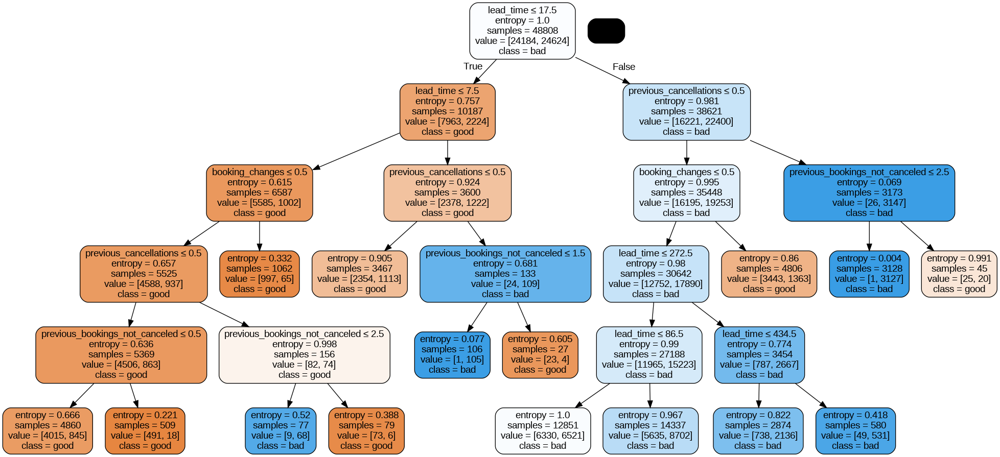

In [31]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features3,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [32]:
df_test.dtypes

arrival_date                    datetime64[ns]
lead_time                                int64
stays_in_weekend_nights                  int64
stays_in_week_nights                     int64
adults                                   int64
                                     ...      
market_segment_Groups                    uint8
market_segment_Offline TA/TO             uint8
market_segment_Online TA                 uint8
assigned_equals_reserved                 int64
temporada_alta                           int64
Length: 175, dtype: object

In [33]:
prueba = df_test.copy()

In [34]:
filas_totales=df_test.shape[0]
print(df_test.isna().sum()/filas_totales*100) 

arrival_date                    0.0
lead_time                       0.0
stays_in_weekend_nights         0.0
stays_in_week_nights            0.0
adults                          0.0
                               ... 
market_segment_Groups           0.0
market_segment_Offline TA/TO    0.0
market_segment_Online TA        0.0
assigned_equals_reserved        0.0
temporada_alta                  0.0
Length: 175, dtype: float64


In [35]:
prueba = df_test[['lead_time','previous_cancellations','booking_changes', 'previous_bookings_not_canceled', 'days_in_waiting_list' ]]

In [36]:
y_pred = arbol.predict(x_test)

In [37]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.6742604277636647
Recall: 0.8604840019490011
Precision: 0.6296648443071072
f1 score: 0.7271978587605518


In [38]:
predicciones = arbol.predict(prueba)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [39]:
predicciones

array([1, 1, 0, ..., 1, 1, 1])

In [40]:
predicciones.size

26535

In [41]:
df_test.shape

(26535, 175)

In [42]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled',
       ...
       'distribution_channel_GDS', 'distribution_channel_TA/TO',
       'market_segment_Complementary', 'market_segment_Corporate',
       'market_segment_Direct', 'market_segment_Groups',
       'market_segment_Offline TA/TO', 'market_segment_Online TA',
       'assigned_equals_reserved', 'temporada_alta'],
      dtype='object', length=175)

In [43]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones})
df_submission.head()
df_submission.shape


(26535, 2)

#Arbol de decision N4

In [45]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [46]:
features4= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']

In [47]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features4].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [48]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,18))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [49]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 15, 'criterion': 'entropy', 'ccp_alpha': 0.0}
0.7558569296971358


In [50]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features4)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

babies: 0.00026935583373027523
is_repeated_guest: 0.002421951352085178
meal_FB: 0.005322997033570238
children: 0.005845759913905579
meal_SC: 0.009725642261871914
previous_bookings_not_canceled: 0.013073490116442424
meal_HB: 0.0156508127634101
adults: 0.017659034087902686
hotel_Resort Hotel: 0.01786469508318177
days_in_waiting_list: 0.02426687470875252
stays_in_weekend_nights: 0.02582748775159852
stays_in_week_nights: 0.03772621602428401
booking_changes: 0.06890546280779536
required_car_parking_spaces: 0.07800710075196908
previous_cancellations: 0.09554352106014187
total_of_special_requests: 0.13872400940742907
average_daily_rate: 0.16822607851654386
lead_time: 0.27493951052538573


In [51]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol4 =DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol4.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol4, feature_names=list(features4)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- lead_time <= 17.50
|   |--- required_car_parking_spaces <= 0.50
|   |   |--- lead_time <= 7.50
|   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |--- hotel_Resort Hotel <= 0.50
|   |   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |   |--- average_daily_rate <= 60.69
|   |   |   |   |   |   |   |   |--- average_daily_rate <= 59.97
|   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 46.12
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 24.12
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  24.12
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 5
|   |   |   |   |   |   |   |   |   |--- average_daily_rate >  46.12
|   |   |   |   |   |   |   |   |   |   |--- is_repeated_guest <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0

In [52]:
y_pred = arbol4.predict(x_test)

In [53]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7603048430713759
Recall: 0.7108981646905961
Precision: 0.7926475914523723
f1 score: 0.7495504752119188


In [54]:
prueba4 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC']]

In [55]:
predicciones4 = arbol4.predict(prueba4)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [56]:
predicciones4

array([1, 1, 0, ..., 1, 0, 0])

In [57]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones4})
df_submission.head()
df_submission.shape

(26535, 2)

In [58]:
#df_submission.to_csv('/content/submissions/submission_v4.csv', index=False)

In [59]:
joblib.dump(arbol4, 'arbol4.pkl')

['arbol4.pkl']

# Arbol de decision N5

In [60]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [61]:
features5= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC','deposit_type_Non Refund', 'deposit_type_Refundable']

In [62]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features5].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [63]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(10,22))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [64]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 14, 'criterion': 'gini', 'ccp_alpha': 0.0}
0.7521490094578859


In [65]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features5)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

deposit_type_Refundable: 0.00042573967298773445
babies: 0.0009670614711468213
is_repeated_guest: 0.0022027266028474173
meal_FB: 0.002745386125719866
children: 0.005294124423688296
days_in_waiting_list: 0.007858947633652236
previous_bookings_not_canceled: 0.008653984690716059
stays_in_weekend_nights: 0.009047095424101573
meal_HB: 0.010731359496526972
adults: 0.012917671441068274
hotel_Resort Hotel: 0.013524772572492521
meal_SC: 0.015458329851238312
stays_in_week_nights: 0.021711690211889345
booking_changes: 0.03621346641350565
total_of_special_requests: 0.04031039300198029
required_car_parking_spaces: 0.05864612986902565
previous_cancellations: 0.06252792707451345
average_daily_rate: 0.12358949473211898
lead_time: 0.15633567347325758
deposit_type_Non Refund: 0.41083802581752304


In [66]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol5=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol5.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol5, feature_names=list(features5)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- lead_time <= 11.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- lead_time <= 7.50
|   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |--- lead_time <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 18.50
|   |   |   |   |   |   |   |--- average_daily_rate <= 7.00
|   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |--- average_daily_rate >  7.00
|   |   |   |   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- hotel_Resort Hotel <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |   |--- hotel_Resort Hotel >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |   |   |   |   |   |--- previous_cancellations >  0.50
|   |   |   |   |   |   |  

In [67]:
df_test.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled',
       ...
       'distribution_channel_GDS', 'distribution_channel_TA/TO',
       'market_segment_Complementary', 'market_segment_Corporate',
       'market_segment_Direct', 'market_segment_Groups',
       'market_segment_Offline TA/TO', 'market_segment_Online TA',
       'assigned_equals_reserved', 'temporada_alta'],
      dtype='object', length=175)

In [68]:
y_pred = arbol5.predict(x_test)

In [69]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7652216668032451
Recall: 0.6951437388338476
Precision: 0.812452543659833
f1 score: 0.7492341356673962


In [70]:
prueba5 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable']]

In [71]:
predicciones5 = arbol5.predict(prueba5)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [72]:
predicciones5

array([1, 1, 0, ..., 1, 0, 0])

In [73]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones5})
df_submission.head()
df_submission.shape

(26535, 2)

In [74]:
df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v5.csv', index=False)

In [75]:
joblib.dump(arbol5, 'arbol5.pkl')

['arbol5.pkl']

# Arbol de decision N6

In [76]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [77]:
features6= ['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']

In [78]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features6].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [79]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [80]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 11, 'criterion': 'gini', 'ccp_alpha': 0.0005172413793103448}
0.7505982820597765


In [81]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features6)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

adults: 0.0048660676260853415
hotel_Resort Hotel: 0.006677995789399551
booking_changes: 0.0283191547799978
total_of_special_requests: 0.04523588460906262
average_daily_rate: 0.04663022548436688
previous_cancellations: 0.05834259371063967
required_car_parking_spaces: 0.07404718122455838
lead_time: 0.10933470599360286
assigned_equals_reserved: 0.12276094082687533
deposit_type_Non Refund: 0.5037852499554115


In [82]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol6=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol6.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol6, feature_names=list(features6)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- lead_time <= 11.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- lead_time <= 7.50
|   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- total_of_special_requests >  0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- lead_time >  7.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- required_car_parking_spaces >  0.50
|   |   |   |   |--- class: 0
|   |   |--- lead_time >  11.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |--- average_daily_rate <= 93.01
|   |   |   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |  

In [83]:
y_pred = arbol6.predict(x_test)

In [84]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7533393427845612
Recall: 0.7800877050511613
Precision: 0.7436135624709708
f1 score: 0.76141407736208


In [85]:
prueba6 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests']]

In [86]:
predicciones6 = arbol6.predict(prueba6)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


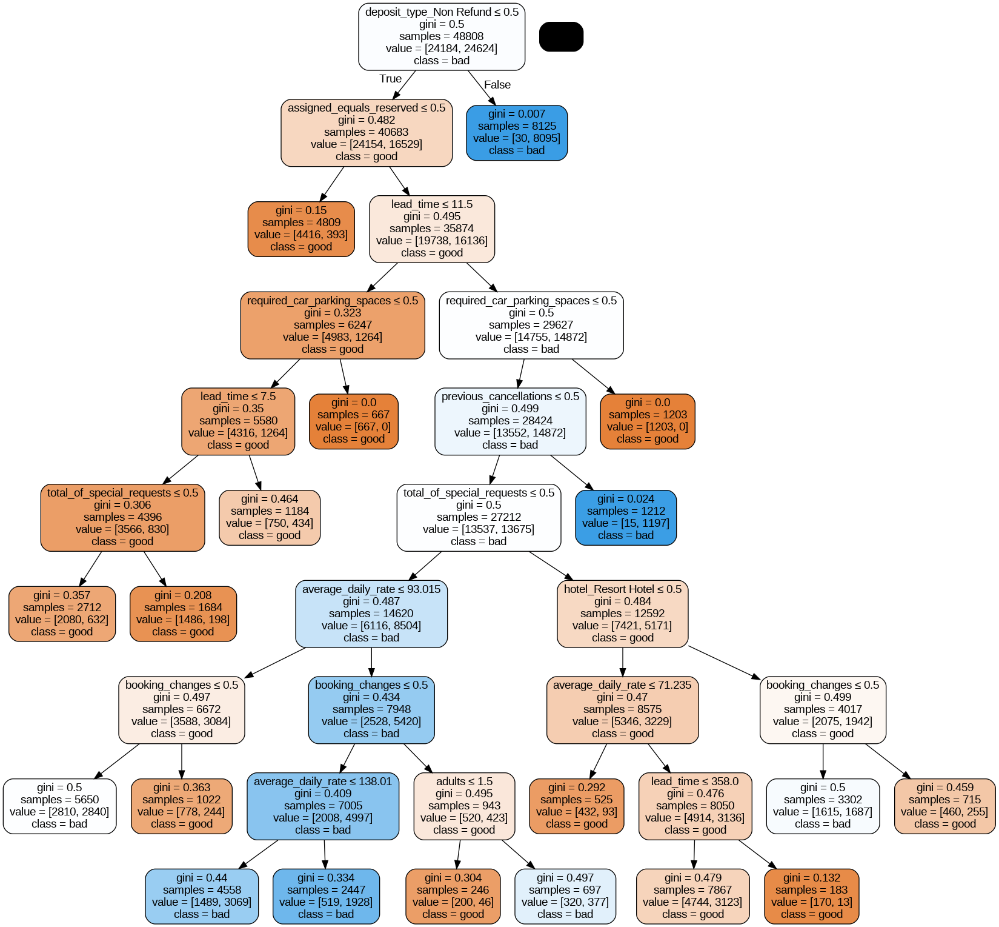

In [87]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol6, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features6,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [88]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones6})
df_submission.head()
df_submission.shape

(26535, 2)

In [89]:
df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v6.csv', index=False)

In [90]:
joblib.dump(arbol6, 'arbol6.pkl')

['arbol6.pkl']

#Arbol de decision N7

In [91]:
features7= ['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']

In [92]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features7].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [93]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [94]:
#Mejores hiperparametros del arbol
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_)

{'max_depth': 14, 'criterion': 'entropy', 'ccp_alpha': 0.0}
0.7611892908804598


In [95]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features7)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

deposit_type_Refundable: 0.00013089444237923226
babies: 0.0003704634175129876
is_repeated_guest: 0.0019064524355276167
meal_FB: 0.0019868724364417345
children: 0.004788223609382571
days_in_waiting_list: 0.0061693355220683345
meal_SC: 0.007642297189032685
stays_in_weekend_nights: 0.008223197463793247
meal_HB: 0.010058993161912015
previous_bookings_not_canceled: 0.010906741407552859
adults: 0.011360789729862944
hotel_Resort Hotel: 0.012815059641634353
stays_in_week_nights: 0.015682129893821395
booking_changes: 0.02902823761476692
total_of_special_requests: 0.035858514565835706
previous_cancellations: 0.05253100584988774
required_car_parking_spaces: 0.08046196041968111
average_daily_rate: 0.09234450797591404
assigned_equals_reserved: 0.09536099284723848
lead_time: 0.11362729485254086
deposit_type_Non Refund: 0.4087460355232131


In [96]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol7=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol7.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol7, feature_names=list(features7)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- booking_changes <= 0.50
|   |   |   |   |--- lead_time <= 212.50
|   |   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |--- is_repeated_guest <= 0.50
|   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 55.50
|   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |   |--- average_daily_rate >  55.50
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate <= 107.10
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- average_daily_rate >  107.10
|   |   |   |   |   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |   |   |--- is_repeated_guest >  0.50
|   |   |   |   |   |   |   |   |   |-

In [97]:
y_pred = arbol7.predict(x_test)

In [98]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7728427435876424
Recall: 0.7125223323046939
Precision: 0.8140656893672296
f1 score: 0.7599168543218431


In [99]:
prueba7 = df_test[['lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable','assigned_equals_reserved']]

In [100]:
predicciones7 = arbol7.predict(prueba7)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.512409 to fit



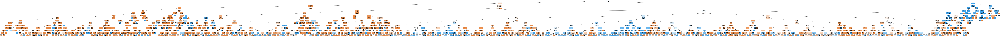

In [101]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol7, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features7,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [102]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones7})
df_submission.head()
df_submission.shape

(26535, 2)

In [103]:
df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v7.csv', index=False)

In [104]:
joblib.dump(arbol7, 'arbol7.pkl')

['arbol7.pkl']

#Arbol de decision N8

In [105]:
features8=['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']

In [106]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features8].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [107]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(9,15))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [108]:
#Mejores hiperparametros del arbol PROBASTE 10 DECIME CUAL FUE EL DE LA MEJOR METRICAS
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) #0.7555114548598617 antes teniamos este con prfundidad 14

{'max_depth': 14, 'criterion': 'gini', 'ccp_alpha': 0.0}
0.7591905344427875


In [109]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features8)): #ME DIJO CON EL ALCOHOL Y SULFATOS TE PUEDO ARMAR UN BUEN CLASIFICADOR (EL ALCOHOL TIENE BUENA CORRELACION CON EL TARGET LO VIMOS EN EL HEATMAP)
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

temporada_alta: 0.0034947374412815173
days_in_waiting_list: 0.00567933470480982
previous_bookings_not_canceled: 0.008347385501919881
hotel_Resort Hotel: 0.009837734750749675
adults: 0.0129965372228867
stays_in_week_nights: 0.0205159292865966
booking_changes: 0.031987343832370396
total_of_special_requests: 0.04310889716759245
previous_cancellations: 0.05222275442141951
required_car_parking_spaces: 0.06118789532159783
assigned_equals_reserved: 0.10020057391026882
average_daily_rate: 0.10271665966795043
lead_time: 0.13650199859719042
deposit_type_Non Refund: 0.411202218173366


In [110]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol8=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol8.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol8, feature_names=list(features8)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- stays_in_week_nights <= 13.50
|   |   |   |   |--- previous_cancellations <= 0.50
|   |   |   |   |   |--- booking_changes <= 0.50
|   |   |   |   |   |   |--- lead_time <= 156.00
|   |   |   |   |   |   |   |--- lead_time <= 154.50
|   |   |   |   |   |   |   |   |--- adults <= 1.50
|   |   |   |   |   |   |   |   |   |--- lead_time <= 113.50
|   |   |   |   |   |   |   |   |   |   |--- lead_time <= 1.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |   |--- lead_time >  1.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 4
|   |   |   |   |   |   |   |   |   |--- lead_time >  113.50
|   |   |   |   |   |   |   |   |   |   |--- stays_in_week_nights <= 1.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 2
|   |   |   |   |

In [111]:
y_pred = arbol8.predict(x_test)

In [112]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.7709579611570925
Recall: 0.7555627740782849
Precision: 0.7829013800067317
f1 score: 0.7689891726588973


In [113]:
prueba8 = df_test[['lead_time',
       'stays_in_week_nights', 'adults',
       'previous_cancellations', 'previous_bookings_not_canceled','booking_changes',
        'days_in_waiting_list',
       'average_daily_rate', 'required_car_parking_spaces',
       'total_of_special_requests', 'hotel_Resort Hotel',
       'deposit_type_Non Refund','assigned_equals_reserved', 'temporada_alta']]

In [114]:
predicciones8 = arbol8.predict(prueba8)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.456295 to fit



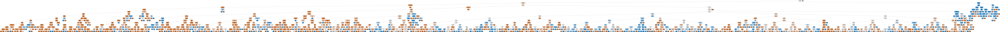

In [115]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol8, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features8,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [116]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones8})
df_submission.head()
df_submission.shape

(26535, 2)

In [117]:
df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v8.csv', index=False)

In [118]:
joblib.dump(arbol8, 'arbol8.pkl')

['arbol8.pkl']

#Arbol de decision N9

In [119]:
dataset.columns

Index(['arrival_date', 'lead_time', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'agent',
       'days_in_waiting_list', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests', 'id',
       'is_canceled', 'assigned_equals_reserved', 'temporada_alta',
       'hotel_Resort Hotel', 'meal_FB', 'meal_HB', 'meal_SC',
       'deposit_type_Non Refund', 'deposit_type_Refundable',
       'customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party', 'country_BEL', 'country_BRA',
       'country_CHE', 'country_CHN', 'country_CN', 'country_DEU',
       'country_ESP', 'country_FRA', 'country_GBR', 'country_IRL',
       'country_ISR', 'country_ITA', 'country_NLD', 'country_NOR',
       'country_OTHER', 'country_POL', 'country_PRT', 'c

In [120]:
features9= ['deposit_type_Non Refund','lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 
'required_car_parking_spaces','booking_changes','stays_in_week_nights','adults','hotel_Resort Hotel','total_of_special_requests',
'customer_type_Group', 'customer_type_Transient','customer_type_Transient-Party','country_PRT', 'country_GBR',
'country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']

In [121]:
x_train, x_test, y_train, y_test = train_test_split(dataset[features9].values, 
                                                    dataset[target].values, 
                                                    test_size=0.2,    #20% al conjunto de test 80/20
                                                    random_state=13,  #para poder reproducir el experimento
                                                    stratify=dataset[target].values) #estratificado para mantener proporcion #QUEREMOS QUE SE RESPETE LA DIST DE LAS CLASES, APRENDER DE LAS 2 CLASES

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

#Verifico como quedaron balanceados
for split_name, split in zip(['% Positivos Entrenamiento','% Positivos Prueba'],[y_train,y_test]):
  print('{}: {:.3f}'.format(split_name,pd.Series(split).value_counts(normalize=True)[1]*100))

# Datos Entrenamiento: 48808
# Datos Prueba: 12203
% Positivos Entrenamiento: 50.451
% Positivos Prueba: 50.455


In [122]:
##KFOLD CV Random Search para buscar el mejor arbol (los mejores atributos, hiperparametros,etc)
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer

#Cantidad de combinaciones que quiero porbar
n=30 #LE PIDO QUE ME ARME 20 COMB POR CADA SPLIT(ENTRENA 20 ARBOLES POR CADA SPLIT)

#Conjunto de parámetros que quiero usar GRILLA DE PARAMETROS
params_grid = {'criterion':['gini','entropy'], #LE DOY POSIBLES CRITERIOS DE PARAMETROS 
               #'min_samples_leaf':list(range(1,10)),
               #'min_samples_split': list(range(2,20)),
               'ccp_alpha':np.linspace(0.001,0.005,n), #UN RANGO DE ALPHA(PODA) CON N CORTES, AUNQUE PODIA SER UN N MAYOR A 10
               'max_depth':list(range(15,24))} #RANGO DE PROFUNDIDAD
                
#Cantidad de splits para el Cross Validation
folds=40 #IGUAL QUE EN EL DIBUJO CUANTAS CECES LO QUIERO PARTIR Y ENTRENAR

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds) #5 FOLDS ESTRATIFICADOS RESPETE LA PROPORCION DE LA CLASE, EN LA MISMA PROPORCION ORIGINAL 

#Clasificador ARMO MI CLASIFICADOR 
base_tree = DecisionTreeClassifier() 

#Metrica que quiero optimizar F1 Score
scorer_fn = make_scorer(sk.metrics.f1_score) #ACA DECIDO QUE MI MEJOR CONJUNTO SEA A BSAE DE MEDIR F1 SCORE 

#Random Search Cross Validation BUSCADOR RANDOM CON VALIDACION CRUZADA
randomcv = RandomizedSearchCV(estimator=base_tree, #CREO MI VALIDACION CRUZADA con busqueda random de hiperparametros RANDOM SEARCH
                              param_distributions = params_grid,
                              scoring=scorer_fn, #METRICA QUE QUUIERO OPTIMIZAR
                              cv=kfoldcv,
                              n_iter=n) #LO TENER QUE HACER 10 VECES, PORQUE ES LA CANT DE HIPERPARAMETROS  

#Busco los hiperparamtros que optimizan F1 Score
randomcv.fit(x_train,y_train); #LO ENTRENO SOBRE MI DATASET DE ENTRENAMIENTO

In [123]:
#Mejores hiperparametros del arbol 
print(randomcv.best_params_)
#Mejor métrica
print(randomcv.best_score_) 

{'max_depth': 16, 'criterion': 'entropy', 'ccp_alpha': 0.001}
0.8214628363425952


In [124]:
#Atributos considerados y su importancia
best_tree = randomcv.best_estimator_ #ME DEVUELVE MI MEJOR ARBOL
feat_imps = best_tree.feature_importances_ #AL MEJOR ARBOL LE PIDO SUS MEJORES FEATURES

for feat_imp,feat in sorted(zip(feat_imps,features9)): 
  if feat_imp>0:
    print('{}: {}'.format(feat,feat_imp))

country_ESP: 0.002235530852749421
hotel_Resort Hotel: 0.0036857009367007192
stays_in_week_nights: 0.004136860882532602
booking_changes: 0.007057114049252362
customer_type_Transient-Party: 0.0070951584857290645
distribution_channel_TA/TO: 0.017083541580905855
average_daily_rate: 0.01845087368560537
customer_type_Transient: 0.023316055225573774
previous_cancellations: 0.03194771724680106
total_of_special_requests: 0.06168939215686031
lead_time: 0.06590731500552763
required_car_parking_spaces: 0.07410186044930948
country_PRT: 0.07839896420044645
assigned_equals_reserved: 0.087997050525923
market_segment_Online TA: 0.13971491152662951
deposit_type_Non Refund: 0.3771819531894534


In [125]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol9=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol9.fit(x_train,y_train) #LO ENTRENO CON TODO EL SET DE ENTRENAMIENTO

reglas = export_text(arbol9, feature_names=list(features9)) #IMPRIMO TODAS LAS REGLAS
print(reglas)

|--- deposit_type_Non Refund <= 0.50
|   |--- assigned_equals_reserved <= 0.50
|   |   |--- country_PRT <= 0.50
|   |   |   |--- class: 0
|   |   |--- country_PRT >  0.50
|   |   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- required_car_parking_spaces >  0.50
|   |   |   |   |--- class: 0
|   |--- assigned_equals_reserved >  0.50
|   |   |--- required_car_parking_spaces <= 0.50
|   |   |   |--- lead_time <= 7.50
|   |   |   |   |--- country_PRT <= 0.50
|   |   |   |   |   |--- market_segment_Online TA <= 0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- market_segment_Online TA >  0.50
|   |   |   |   |   |   |--- total_of_special_requests <= 0.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- total_of_special_requests >  0.50
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- country_PRT >  0.50
|   |   |   |   |   |--- class: 0
|   |   |   |--- lead_time >  7.50
|   |   |   |   |--- c

In [126]:
y_pred = arbol9.predict(x_test)

In [127]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8170941571744653
Recall: 0.7990904661361052
Precision: 0.8317836010143702
f1 score: 0.8151093439363817


In [128]:
prueba9 = df_test[['deposit_type_Non Refund', 'lead_time','average_daily_rate','assigned_equals_reserved','previous_cancellations', 'required_car_parking_spaces', 'booking_changes','stays_in_week_nights','adults', 'hotel_Resort Hotel','total_of_special_requests','customer_type_Group', 'customer_type_Transient',
       'customer_type_Transient-Party','country_PRT', 'country_GBR','country_FRA','country_ESP','country_DEU', 'distribution_channel_TA/TO','market_segment_Offline TA/TO', 'market_segment_Online TA']]

In [129]:
predicciones9 = arbol9.predict(prueba9)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


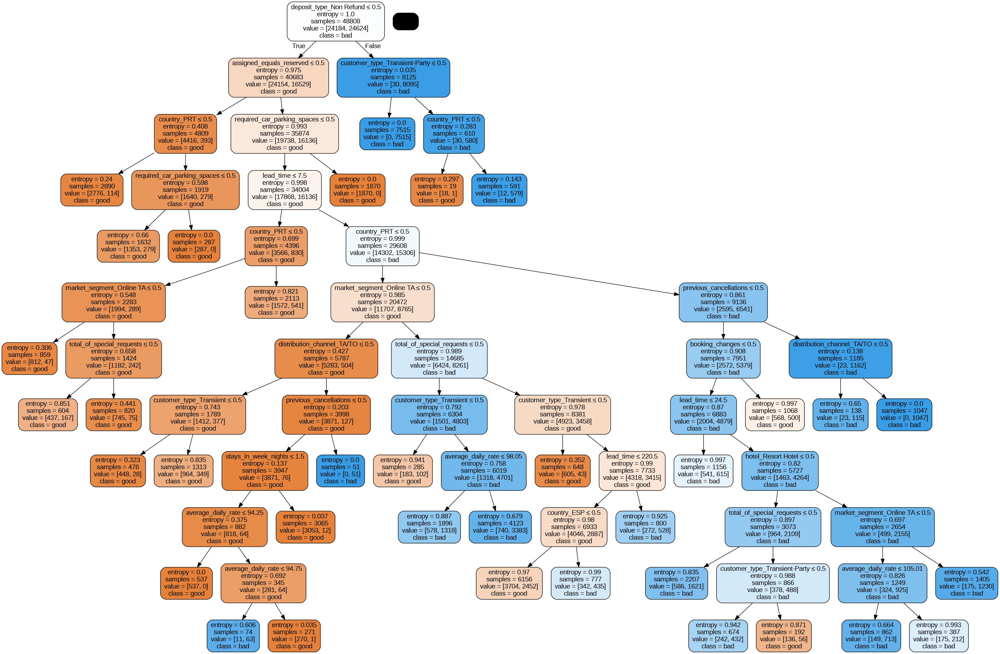

In [130]:
from six import StringIO #IMPRIMO EL ARBOL
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
import matplotlib.pyplot as plt

dot_data = StringIO()
export_graphviz(arbol9, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names=features9,
                class_names=['good','bad'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [131]:
df_submission = pd.DataFrame({'id':df_test['id'], 'is_canceled':predicciones9})
df_submission.head()
df_submission.shape

(26535, 2)

In [132]:
df_submission.to_csv('/content/drive/MyDrive/submissions/submission_v10.csv', index=False)

# Matriz de Confusion

In [133]:
y_pred = arbol9.predict(x_test)

Text(50.722222222222214, 0.5, 'True')

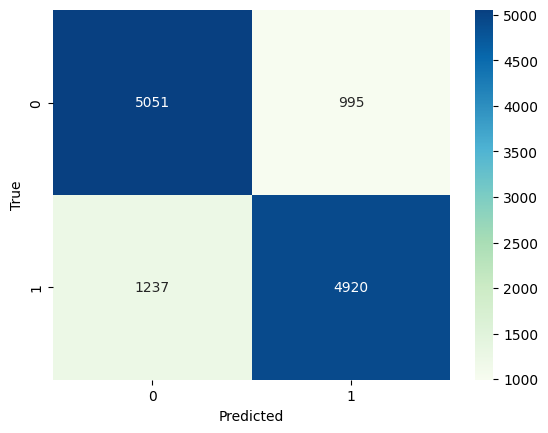

In [134]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test, y_pred)

#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

# Performance

In [135]:
accuracy=accuracy_score(y_test,y_pred)
recall=recall_score(y_test,y_pred)
f1=f1_score(y_test,y_pred)
precision=precision_score(y_test,y_pred)

print("Accuracy: "+str(accuracy)) 
print("Recall: "+str(recall))
print("Precision: "+str(precision))
print("f1 score: "+str(f1))

Accuracy: 0.8170941571744653
Recall: 0.7990904661361052
Precision: 0.8317836010143702
f1 score: 0.8151093439363817


In [136]:
joblib.dump(arbol9, 'arbol9.pkl')

['arbol9.pkl']